In [2]:
import pandas as pd
import numpy as np
import pandas as pd
import os

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE

from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier

from sklearn import tree
import xgboost as xgb
from numpy import loadtxt
from xgboost import XGBClassifier
from xgboost import plot_tree

import gc
from tqdm import tqdm

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error, recall_score

from sklearn.model_selection import cross_val_predict
from keras import models
from keras import layers
from keras import regularizers
from keras.wrappers.scikit_learn import KerasRegressor
from keras.models import load_model
from scipy import stats
import statsmodels.api as sm
from sklearn import tree
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from xgboost import XGBRFClassifier
from sklearn.metrics import roc_auc_score

In [3]:
column_defs = pd.read_excel('data\LCDataDictionary.xlsx',index_col='LoanStatNew')
column_defs.columns

Index(['Description'], dtype='object')

In [4]:
def column_info(col_name):
    return column_defs.loc[col_name]['Description']

In [5]:
def na_check(data):
    check = np.round(data.isna().sum().sort_values(ascending=False),2)
    return check

In [6]:
def reduce_mem_usage(df, int_cast=True, obj_to_category=False, subset=None):
    """
    Iterate through all the columns of a dataframe and modify the data type to reduce memory usage.
    :param df: dataframe to reduce (pd.DataFrame)
    :param int_cast: indicate if columns should be tried to be casted to int (bool)
    :param obj_to_category: convert non-datetime related objects to category dtype (bool)
    :param subset: subset of columns to analyse (list)
    :return: dataset with the column dtypes adjusted (pd.DataFrame)
    """
    start_mem = df.memory_usage().sum() / 1024 ** 2;
    gc.collect()
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))

    cols = subset if subset is not None else df.columns.tolist()

    for col in tqdm(cols):
        col_type = df[col].dtype

        if col_type != object and col_type.name != 'category' and 'datetime' not in col_type.name:
            c_min = df[col].min()
            c_max = df[col].max()

            # test if column can be converted to an integer
            treat_as_int = str(col_type)[:3] == 'int'
            if int_cast and not treat_as_int:
                treat_as_int = check_if_integer(df[col])

            if treat_as_int:
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.uint8).min and c_max < np.iinfo(np.uint8).max:
                    df[col] = df[col].astype(np.uint8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.uint16).min and c_max < np.iinfo(np.uint16).max:
                    df[col] = df[col].astype(np.uint16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.uint32).min and c_max < np.iinfo(np.uint32).max:
                    df[col] = df[col].astype(np.uint32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
                elif c_min > np.iinfo(np.uint64).min and c_max < np.iinfo(np.uint64).max:
                    df[col] = df[col].astype(np.uint64)
            else:
                if c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        elif 'datetime' not in col_type.name and obj_to_category:
            df[col] = df[col].astype('category')
    gc.collect()
    end_mem = df.memory_usage().sum() / 1024 ** 2
    print('Memory usage after optimization is: {:.3f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))

    return df

In [7]:
def modelfit(model, x, y, features, xval, yval, useTrainCV=True, cv_folds=3, early_stopping_rounds=20):
    
    if useTrainCV:
        xgb_param = model.get_xgb_params()
        xgtrain = xgb.DMatrix(x[features], label=y.loan_status.values)
        cvresult = xgb.cv(xgb_param, xgtrain, num_boost_round=1, nfold=cv_folds,
            metrics='auc', early_stopping_rounds=early_stopping_rounds,verbose_eval=True)
        model.set_params(n_estimators=cvresult.shape[0])
    
    #Fit the algorithm on the data
    model.fit(x[features], y.loan_status,eval_set=[(x[features],y.loan_status.values),(xval[features],yval.loan_status.values)],eval_metric='auc')
        
    #Predict training set:
    dtrain_predictions = model.predict(x[features])
    dtrain_predprob = model.predict_proba(x[features])[:,1]
    
     #Predict training set:
    dval_predictions = model.predict(xval[features])
    dval_predprob = model.predict_proba(xval[features])[:,1]
    
    #Print model report:
    print ("\nModel Report")
    print ("Accuracy : %.4g" % accuracy_score(y['loan_status'].values, dtrain_predictions))
    print ("AUC Score (Train): %f" % roc_auc_score(y['loan_status'], dtrain_predprob))
    print ("Recall Score (Train): %f" % recall_score(y['loan_status'], dtrain_predictions))
    
    print ("Accuracy : %.4g" % accuracy_score(y['loan_status'].values, dval_predictions))
    print ("AUC Score (Val): %f" % roc_auc_score(y['loan_status'], dval_predprob))
    print ("Recall Score (Val): %f" % recall_score(y['loan_status'], dval_predictions))
                    
    feat_imp = pd.Series(model.get_booster().get_fscore()).sort_values(ascending=False)
    feat_imp.plot(kind='bar', title='Feature Importances')
    plt.ylabel('Feature Importance Score')

In [8]:
def model_results(x_test,y_test,features,model):
    y_hat = model.predict(x_test[features])
    cf = confusion_matrix(y_test,y_hat)
    plot_confusion_matrix(model,x_test[features],y_test,cmap=plt.cm.Blues,
                     display_labels=["Fully Paid", "Charged Off"],
                      values_format=".5g")
    plt.title("{} Confusion Matrix".format(model))

    print(confusion_matrix(y_test, y_hat))
    print(classification_report(y_test, y_hat))

In [9]:
def model_scores(y_true,y_pred,model_name):
    results = ({'Model':model_name,
               'precision_score': precision_score(y_true,y_pred),
               'recall_score': recall_score(y_true,y_pred),
               'accuracy_score': accuracy_score(y_true,y_pred),
               'f1_score': f1_score(y_true,y_pred)})
    model_results = pd.DataFrame(data=results,index=[0])

In [10]:
df = pd.read_csv('data/full_clean_pre_z')
df.drop('Unnamed: 0',axis=1,inplace=True)
reduce_mem_usage(df,int_cast=False)

  0%|          | 0/50 [00:00<?, ?it/s]

Memory usage of dataframe is 662.59 MB


100%|██████████| 50/50 [00:08<00:00,  5.94it/s]


Memory usage after optimization is: 374.363 MB
Decreased by 43.5%


,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,...,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,pub_rec_bankruptcies,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,average_fico,region
0,12000.0,36,10.99,392.799988,B,B2,4,RENT,60000.0,Not Verified,...,0.0,0.0,4.0,100.000000,0.0,7137.0,18100.0,0.0,722.0,South
1,4800.0,36,10.99,157.100006,B,B2,2,MORTGAGE,39600.0,Source Verified,...,0.0,0.0,0.0,100.000000,0.0,4136.0,25700.0,0.0,757.0,South
2,27060.0,36,10.99,885.500000,B,B2,10,OWN,55000.0,Verified,...,0.0,0.0,1.0,100.000000,0.0,70186.0,35700.0,33054.0,732.0,Midwest
3,12000.0,36,7.62,374.000000,A,A3,3,MORTGAGE,96500.0,Not Verified,...,0.0,0.0,3.0,100.000000,0.0,46738.0,14800.0,53404.0,707.0,South
4,14000.0,36,12.85,470.799988,B,B4,4,RENT,88000.0,Not Verified,...,0.0,0.0,0.0,78.599998,1.0,17672.0,3900.0,27340.0,672.0,South
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1736932,24000.0,60,23.99,690.500000,E,E2,1,RENT,107000.0,Source Verified,...,0.0,1.0,2.0,87.500000,1.0,60812.0,28200.0,64422.0,672.0,West
1736933,10000.0,36,7.99,313.200012,A,A5,10,MORTGAGE,65000.0,Source Verified,...,0.0,0.0,2.0,92.599998,0.0,55863.0,34800.0,70203.0,727.0,Northeast
1736934,10050.0,36,16.99,358.200012,D,D1,8,RENT,37000.0,Not Verified,...,0.0,0.0,5.0,95.199997,0.0,14300.0,9000.0,0.0,707.0,South
1736935,6000.0,36,11.44,197.800003,B,B4,5,RENT,41000.0,Source Verified,...,0.0,0.0,1.0,94.400002,0.0,26201.0,8100.0,34076.0,672.0,Northeast


In [11]:
#list of categorical variables to get ohe
categorical = ['sub_grade',
 'grade',
 'home_ownership',
 'verification_status',
 'purpose',
 'application_type',
 'region']


cat_drop = ['sub_grade',
 'grade',
 'home_ownership',
 'verification_status',
 'purpose',
 'application_type',
 'region','loan_status']

In [12]:
cont_columns = df.drop(columns=cat_drop).columns

In [13]:
# removing outliers greater than 4 std deviations to standardize
df_cont_z = df[(np.abs(stats.zscore(df[cont_columns]))<4).all(axis=1)]
z_score_df = df.loc[df_cont_z.index]

In [14]:
onehot = pd.get_dummies(z_score_df[categorical],drop_first=True)

In [15]:
cont = z_score_df.drop(columns=cat_drop)


In [16]:
x= pd.concat([cont,onehot],axis=1)
y= z_score_df['loan_status'].map(lambda x: 1 if x== "Charged Off" else 0)

In [17]:
#splitting our x and y into training and testing samples
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3,random_state=42)

In [18]:
#importing our priorly smoted x train and y train samples
x_smote = pd.read_csv('data/x_smote_z')
y_smote = pd.read_csv('data/y_smote_z')

In [19]:
# as we dropped columns after testing to our original df need to drop from smote so they aren't included in smote modeling
# at end will need to re run smote 
x_smote.drop(columns=['Unnamed: 0','total_rec_int','total_rec_prncp','total_pymnt',
                 'tot_coll_amt','num_il_tl','delinq_amnt','tax_liens','last_pymnt_amnt'],axis=1,inplace=True)

In [20]:
reduce_mem_usage(x_smote,int_cast=False)

  0%|          | 0/106 [00:00<?, ?it/s]

Memory usage of dataframe is 1314.89 MB


100%|██████████| 106/106 [00:24<00:00,  4.38it/s]


Memory usage after optimization is: 350.430 MB
Decreased by 73.3%


,loan_amnt,term,int_rate,installment,emp_length,annual_inc,dti,delinq_2yrs,inq_last_6mths,pub_rec,...,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,application_type_Joint App,region_Northeast,region_South,region_West
0,7750.000000,36,10.990000,253.800003,3,29000.000000,25.200001,0.000000,0.000000,1.000000,...,0,0,0,0,0,0,0,0,0,0
1,10000.000000,36,22.910000,386.799988,1,72000.000000,8.200000,1.000000,0.000000,0.000000,...,0,0,0,0,0,0,0,0,1,0
2,10000.000000,36,12.990000,337.000000,6,40000.000000,22.500000,0.000000,2.000000,0.000000,...,0,1,0,0,0,0,0,0,0,0
3,5500.000000,36,16.549999,194.899994,4,54224.000000,20.440001,0.000000,2.000000,0.000000,...,0,0,0,0,0,0,0,0,1,0
4,25000.000000,36,14.520000,861.000000,5,75000.000000,24.980000,0.000000,2.000000,1.000000,...,0,1,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1625891,24366.757812,51,17.206345,707.872986,4,117479.695312,21.083889,0.633242,1.100275,0.000000,...,0,0,0,0,0,0,0,0,1,0
1625892,19482.703125,50,15.419235,542.377869,5,51204.097656,22.845705,0.000000,0.602049,0.602049,...,0,0,0,0,0,0,0,0,0,0
1625893,13179.145508,36,14.562667,461.734833,6,55000.000000,18.415403,0.000000,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0
1625894,17840.857422,45,21.473141,597.083801,8,54589.417969,23.626722,0.000000,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0


In [21]:
y_smote.drop('Unnamed: 0',axis=1,inplace=True)
reduce_mem_usage(y_smote,int_cast=False)

100%|██████████| 1/1 [00:00<00:00, 58.84it/s]

Memory usage of dataframe is 12.40 MB


Memory usage after optimization is: 1.551 MB
Decreased by 87.5%


,loan_status
0,0
1,1
2,0
3,1
4,1
...,...
1625891,1
1625892,1
1625893,1
1625894,1


In [22]:
scaler = MinMaxScaler()

In [23]:
#scaling our smote training samples
x_smote_cont =  pd.DataFrame(scaler.fit_transform(x_smote[cont_columns]),columns=cont_columns)
x_smote_scaled = pd.concat([x_smote_cont,x_smote[onehot.columns]],axis=1)

#scaling for our x test sample
x_test= x_test.reset_index().drop('index',axis=1)
x_test_cont_scaled = pd.DataFrame(scaler.transform(x_test[cont_columns]),columns=cont_columns)
x_test_scaled = pd.concat([x_test_cont_scaled,x_test[onehot.columns]],axis=1)

In [24]:
#further splitting our training into validation sets we will use in crossvalidation
x_train_final, x_val, y_train_final, y_val = train_test_split(x_smote_scaled, y_smote, test_size=.3,random_state=42)

In [25]:
x_train = x_train.reset_index().drop('index',axis=1)
x_cont =  pd.DataFrame(scaler.fit_transform(x_train[cont_columns]),columns=cont_columns)
x_train_scaled = pd.concat([x_cont,x_train[onehot.columns]],axis=1)



In [26]:
y_train = y_train.reset_index().drop('index',axis=1)

In [27]:
## Relevant feature groups
#for testing unsmoted without recoveries
og_no =['loan_amnt','term','int_rate','installment','emp_length','annual_inc','dti','delinq_2yrs','inq_last_6mths',
 'revol_bal','average_fico','total_acc','total_rec_late_fee','tot_cur_bal','bc_util','mo_sin_rcnt_tl',
 'mort_acc','mths_since_recent_bc','mths_since_recent_inq',
 'num_accts_ever_120_pd','num_bc_sats','num_bc_tl','num_op_rev_tl','num_tl_90g_dpd_24m',
'num_tl_op_past_12m','pct_tl_nvr_dlq','pub_rec_bankruptcies','total_bal_ex_mort','total_bc_limit','total_il_high_credit_limit',
'grade_B','grade_C','grade_D','grade_E','grade_F','grade_G','home_ownership_MORTGAGE','home_ownership_OWN','home_ownership_RENT',
'verification_status_Source Verified','verification_status_Verified','purpose_credit_card','purpose_debt_consolidation',
'purpose_home_improvement','purpose_house','purpose_major_purchase','purpose_other','purpose_renewable_energy',
'purpose_small_business','purpose_vacation','purpose_wedding','application_type_Joint App', 'region_South','region_West']

#for testing unsmoted with recoveries
og_yes = ['recoveries',
'loan_amnt','term','int_rate','installment','emp_length','annual_inc','dti','delinq_2yrs',
 'revol_bal','average_fico','total_acc','total_rec_late_fee','tot_cur_bal','bc_util',
 'mort_acc','mths_since_recent_bc','mths_since_recent_inq',
'num_bc_sats','num_bc_tl','num_op_rev_tl','num_tl_90g_dpd_24m',
'num_tl_op_past_12m','pct_tl_nvr_dlq','pub_rec_bankruptcies','total_bal_ex_mort','total_bc_limit','total_il_high_credit_limit',
'grade_B','grade_C','grade_D','grade_E','grade_F','grade_G','home_ownership_MORTGAGE','home_ownership_OWN','home_ownership_RENT',
'verification_status_Source Verified','verification_status_Verified','purpose_credit_card','purpose_debt_consolidation',
'purpose_home_improvement','purpose_house','purpose_major_purchase','purpose_other',
'purpose_vacation','purpose_wedding','application_type_Joint App', 'region_South','region_West']

#for testing smoted samples with recoveries
recover = ['recoveries',
'loan_amnt','term','int_rate','installment','emp_length','annual_inc','dti','delinq_2yrs','inq_last_6mths',
'pub_rec', 'revol_bal','total_acc','total_rec_late_fee','tot_cur_bal','bc_util','mo_sin_rcnt_tl',
 'mths_since_recent_bc', 'num_accts_ever_120_pd',
 'num_bc_sats', 'num_bc_tl',
 'num_op_rev_tl', 'num_tl_90g_dpd_24m',
 'num_tl_op_past_12m', 'pct_tl_nvr_dlq',
 'total_bal_ex_mort', 'total_bc_limit',
 'total_il_high_credit_limit','average_fico',
 'sub_grade_A2',
 'sub_grade_A3','sub_grade_A4','sub_grade_A5','sub_grade_B1','sub_grade_B2','sub_grade_B3','sub_grade_B4','sub_grade_B5',
 'sub_grade_C1','sub_grade_C2','sub_grade_C3','sub_grade_C4','sub_grade_C5','sub_grade_D1','sub_grade_D2',
 'sub_grade_D3','sub_grade_D4','sub_grade_D5','sub_grade_E1'
,'sub_grade_E2','sub_grade_E3','sub_grade_E4','sub_grade_E5','sub_grade_F1','sub_grade_F2','sub_grade_F3','sub_grade_F4',
 'sub_grade_F5','sub_grade_G1','sub_grade_G2','sub_grade_G3','sub_grade_G4','sub_grade_G5',
 'home_ownership_MORTGAGE','home_ownership_OWN','home_ownership_RENT',
'verification_status_Source Verified','verification_status_Verified',
 'purpose_credit_card','purpose_debt_consolidation','purpose_home_improvement','purpose_house','purpose_major_purchase',
'purpose_other','purpose_renewable_energy','purpose_small_business','purpose_vacation', 'purpose_wedding','purpose_medical',
'purpose_moving',
'application_type_Joint App',
 'region_South','region_West','region_Northeast']

no_recover = ['loan_amnt','term','int_rate','installment','emp_length','annual_inc','dti','delinq_2yrs','inq_last_6mths',
'pub_rec', 'revol_bal','total_acc','total_rec_late_fee','tot_cur_bal','bc_util','mo_sin_rcnt_tl',
 'mths_since_recent_bc', 'num_accts_ever_120_pd',
 'num_bc_sats', 'num_bc_tl',
 'num_op_rev_tl', 'num_tl_90g_dpd_24m',
 'num_tl_op_past_12m', 'pct_tl_nvr_dlq',
 'total_bal_ex_mort', 'total_bc_limit',
 'total_il_high_credit_limit','average_fico',
 'sub_grade_A2',
 'sub_grade_A3','sub_grade_A4','sub_grade_A5','sub_grade_B1','sub_grade_B2','sub_grade_B3','sub_grade_B4','sub_grade_B5',
 'sub_grade_C1','sub_grade_C2','sub_grade_C3','sub_grade_C4','sub_grade_C5','sub_grade_D1','sub_grade_D2',
 'sub_grade_D3','sub_grade_D4','sub_grade_D5','sub_grade_E1'
,'sub_grade_E2','sub_grade_E3','sub_grade_E4','sub_grade_E5','sub_grade_F1','sub_grade_F2','sub_grade_F3','sub_grade_F4',
 'sub_grade_F5','sub_grade_G1','sub_grade_G2','sub_grade_G3','sub_grade_G4','sub_grade_G5',
 'home_ownership_MORTGAGE','home_ownership_OWN','home_ownership_RENT',
'verification_status_Source Verified','verification_status_Verified',
 'purpose_credit_card','purpose_debt_consolidation','purpose_home_improvement','purpose_house','purpose_major_purchase',
'purpose_other','purpose_renewable_energy','purpose_small_business','purpose_vacation', 'purpose_wedding','purpose_medical',
'purpose_moving',
'application_type_Joint App',
 'region_South','region_West','region_Northeast']

## Decision Tree Model Tuning with XGBoost

In [28]:
from sklearn.utils import class_weight

In [29]:
scale_pos = np.bincount(y_train.loan_status)[0] / np.bincount(y_train.loan_status)[1]

In [30]:
class_weights = class_weight.compute_class_weight('balanced',np.unique(y_train.loan_status),y_train.loan_status)

C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=0          0
1          1
2          0
3          0
4          0
          ..
1018640    0
1018641    0
1018642    0
1018643    0
1018644    1
Name: loan_status, Length: 1018645, dtype: int64 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


### XG Boost on unsmoted data without recoveries

In [31]:
xg_cw = XGBClassifier(scale_pos_weight=scale_pos)

In [32]:
xg_cw.fit(x_train_scaled[og_no],y_train)

C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=4.459620105264286,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

[[244511 112035]
 [ 26693  53324]]
              precision    recall  f1-score   support

           0       0.90      0.69      0.78    356546
           1       0.32      0.67      0.43     80017

    accuracy                           0.68    436563
   macro avg       0.61      0.68      0.61    436563
weighted avg       0.80      0.68      0.72    436563



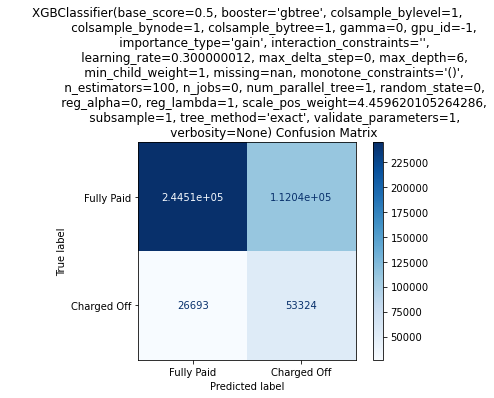

In [33]:
# Without recoveries
model_results(x_test_scaled,y_test,og_no,xg_cw)

### XGBoost Decision Tree on unsmoted data with recoveries

In [34]:
xg_cw.fit(x_train_scaled[og_yes],y_train)

C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=4.459620105264286,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

[[344369  12177]
 [ 19284  60733]]
              precision    recall  f1-score   support

           0       0.95      0.97      0.96    356546
           1       0.83      0.76      0.79     80017

    accuracy                           0.93    436563
   macro avg       0.89      0.86      0.88    436563
weighted avg       0.93      0.93      0.93    436563



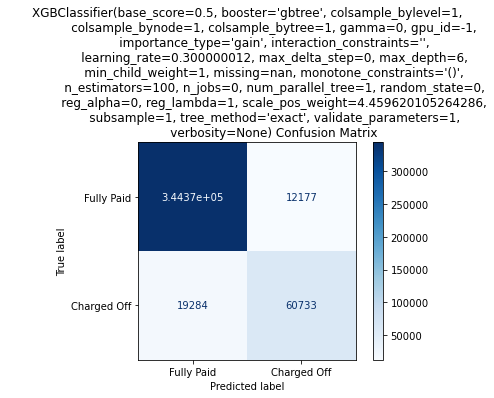

In [35]:
#with recoveries
model_results(x_test_scaled,y_test,og_yes,xg_cw)

### XGBoosted Decision Tree With Smote and recoveries

In [36]:
xg_smote = XGBClassifier()

In [37]:
xg_smote.fit(x_train_final[recover],y_train_final)

C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

[[356211    335]
 [ 23041  56976]]
              precision    recall  f1-score   support

           0       0.94      1.00      0.97    356546
           1       0.99      0.71      0.83     80017

    accuracy                           0.95    436563
   macro avg       0.97      0.86      0.90    436563
weighted avg       0.95      0.95      0.94    436563



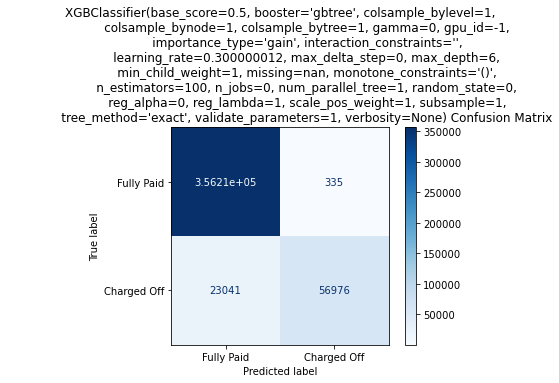

In [38]:
#with recoveries
model_results(x_test_scaled,y_test,recover,xg_smote)

### XGBoosted Decision Tree with smote without recoveries

In [39]:
xg_smote.fit(x_train_final[no_recover],y_train_final)

C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

[[348143   8403]
 [ 67188  12829]]
              precision    recall  f1-score   support

           0       0.84      0.98      0.90    356546
           1       0.60      0.16      0.25     80017

    accuracy                           0.83    436563
   macro avg       0.72      0.57      0.58    436563
weighted avg       0.80      0.83      0.78    436563



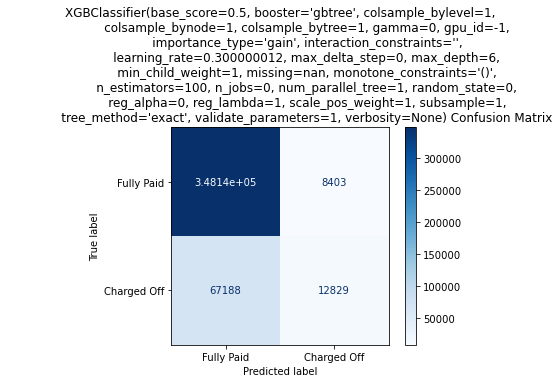

In [40]:
model_results(x_test_scaled,y_test,no_recover,xg_smote)

Can see without any tuning our smote has a better model overall than class weighted one on unsmoted train data

## Tuning

In [41]:
def modelfit2(model, x, y, features, xval, yval, useTrainCV=True, cv_folds=3, early_stopping_rounds=5):
    
    if useTrainCV:
        xgb_param = model.get_xgb_params()
        xgtrain = xgb.DMatrix(x[features], label=y.loan_status.values)
        cvresult = xgb.cv(xgb_param, xgtrain, num_boost_round=model.get_params()['n_estimators'], nfold=cv_folds,
            metrics='auc', early_stopping_rounds=early_stopping_rounds,verbose_eval=True)
        model.set_params(n_estimators=cvresult.shape[0])
    
    #Fit the algorithm on the data
    model.fit(x[features], y.loan_status,eval_metric='auc')
        
    #Predict training set:
    dtrain_predictions = model.predict(x[features])
    dtrain_predprob = model.predict_proba(x[features])[:,1]
    
     #Predict training set:
    dval_predictions = model.predict(xval[features])
    dval_predprob = model.predict_proba(xval[features])[:,1]
    
    #Print model report:
    print ("\nModel Report")
    print ("Accuracy : %.4g" % accuracy_score(y['loan_status'].values, dtrain_predictions))
    print ("AUC Score (Train): %f" % roc_auc_score(y['loan_status'], dtrain_predprob))
    print ("Recall Score (Train): %f" % recall_score(y['loan_status'], dtrain_predictions))
    
    print ("Accuracy : %.4g" % accuracy_score(yval['loan_status'].values, dval_predictions))
    print ("AUC Score (Val): %f" % roc_auc_score(yval['loan_status'], dval_predprob))
    print ("Recall Score (Val): %f" % recall_score(yval['loan_status'], dval_predictions))
                    
    feat_imp = pd.Series(model.get_booster().get_fscore()).sort_values(ascending=False).head(15)
    feat_imp.plot(kind='bar', title='Feature Importances')
    plt.ylabel('Feature Importance Score')

[0]	train-auc:0.83657+0.00462	test-auc:0.83640+0.00469
[1]	train-auc:0.87022+0.01292	test-auc:0.86976+0.01272
[2]	train-auc:0.89169+0.00417	test-auc:0.89149+0.00385
[3]	train-auc:0.90216+0.00341	test-auc:0.90199+0.00351
[4]	train-auc:0.91186+0.00284	test-auc:0.91161+0.00309
[5]	train-auc:0.91740+0.00103	test-auc:0.91726+0.00079
[6]	train-auc:0.92187+0.00196	test-auc:0.92175+0.00233
[7]	train-auc:0.92395+0.00144	test-auc:0.92380+0.00172
[8]	train-auc:0.92619+0.00103	test-auc:0.92603+0.00129
[9]	train-auc:0.92809+0.00133	test-auc:0.92783+0.00167
[10]	train-auc:0.92945+0.00140	test-auc:0.92917+0.00167
[11]	train-auc:0.93082+0.00107	test-auc:0.93051+0.00113
[12]	train-auc:0.93192+0.00095	test-auc:0.93161+0.00118
[13]	train-auc:0.93273+0.00090	test-auc:0.93241+0.00108
[14]	train-auc:0.93323+0.00099	test-auc:0.93285+0.00116
[15]	train-auc:0.93391+0.00055	test-auc:0.93351+0.00094
[16]	train-auc:0.93441+0.00041	test-auc:0.93401+0.00085
[17]	train-auc:0.93490+0.00038	test-auc:0.93447+0.00080
[1

AUC Score (Val): 0.942150
Recall Score (Val): 0.809269


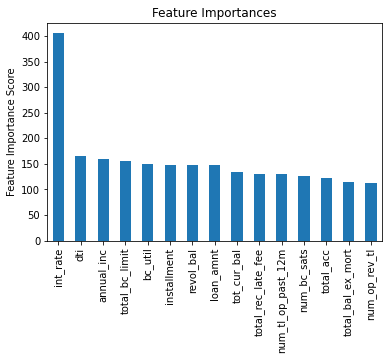

In [97]:
#finding number of estimators to run
xgb2 = XGBClassifier(
 learning_rate =.35,
 n_estimators=200,
 max_depth=5,
 min_child_weight=1,
 gamma=0,
 subsample=0.8,
 colsample_bytree=0.8,
 objective= 'binary:logistic', verbosity=1,nthread=4)

modelfit2(xgb2, x_train_final, y_train_final,no_recover,x_val,y_val)

[[348114   8432]
 [ 67366  12651]]
              precision    recall  f1-score   support

           0       0.84      0.98      0.90    356546
           1       0.60      0.16      0.25     80017

    accuracy                           0.83    436563
   macro avg       0.72      0.57      0.58    436563
weighted avg       0.79      0.83      0.78    436563



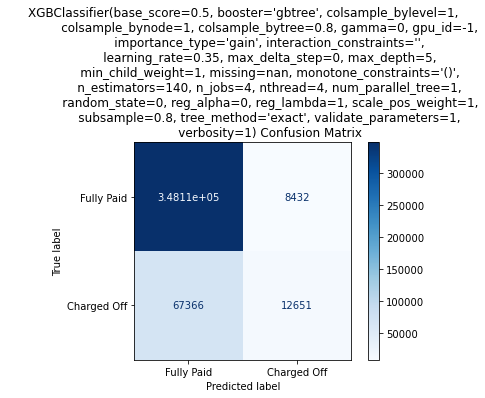

In [98]:
model_results(x_test_scaled,y_test,no_recover,xgb2)

[0]	train-error:0.24115+0.00479	test-error:0.24163+0.00499
[1]	train-error:0.20818+0.01306	test-error:0.20860+0.01298
[2]	train-error:0.17152+0.00555	test-error:0.17126+0.00543
[3]	train-error:0.15466+0.00585	test-error:0.15473+0.00662
[4]	train-error:0.14017+0.00400	test-error:0.14019+0.00503
[5]	train-error:0.13210+0.00142	test-error:0.13223+0.00232
[6]	train-error:0.12649+0.00133	test-error:0.12642+0.00208
[7]	train-error:0.12525+0.00131	test-error:0.12540+0.00240
[8]	train-error:0.12311+0.00193	test-error:0.12336+0.00252
[9]	train-error:0.12191+0.00083	test-error:0.12201+0.00141
[10]	train-error:0.12077+0.00120	test-error:0.12078+0.00170
[11]	train-error:0.11906+0.00101	test-error:0.11918+0.00133
[12]	train-error:0.11803+0.00053	test-error:0.11824+0.00091
[13]	train-error:0.11668+0.00108	test-error:0.11704+0.00091
[14]	train-error:0.11588+0.00114	test-error:0.11616+0.00114
[15]	train-error:0.11507+0.00116	test-error:0.11530+0.00106
[16]	train-error:0.11444+0.00097	test-error:0.1149

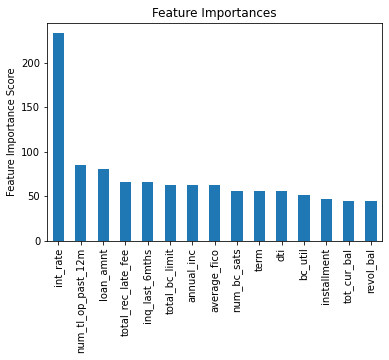

In [76]:
#finding number of estimators to run
xgb2 = XGBClassifier(
 learning_rate =.5,
 n_estimators=200,
 max_depth=5,
 min_child_weight=2,
 gamma=0,
 subsample=0.8,
 colsample_bytree=0.8,
 objective= 'binary:logistic', verbosity=1,nthread=4)

modelfit2(xgb2, x_train_final, y_train_final,no_recover,x_val,y_val)

[[347774   8772]
 [ 67113  12904]]
              precision    recall  f1-score   support

           0       0.84      0.98      0.90    356546
           1       0.60      0.16      0.25     80017

    accuracy                           0.83    436563
   macro avg       0.72      0.57      0.58    436563
weighted avg       0.79      0.83      0.78    436563



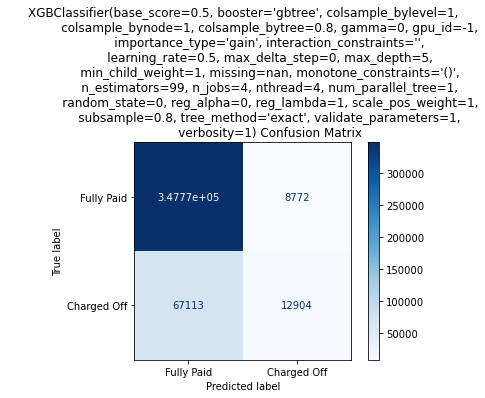

In [96]:
model_results(x_test_scaled,y_test,no_recover,xgb2)

## Baseline Random Forest

In [250]:
rf = RandomForestClassifier(n_jobs=4)

In [248]:
rf.fit(x_train_final[no_recover],y_train_final)

<ipython-input-248-b056f4ba5af9>:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf.fit(x_train_final[no_recover],y_train_final)


RandomForestClassifier(max_depth=10)

[[350180   6366]
 [ 33999  46018]]
              precision    recall  f1-score   support

           0       0.91      0.98      0.95    356546
           1       0.88      0.58      0.70     80017

    accuracy                           0.91    436563
   macro avg       0.89      0.78      0.82    436563
weighted avg       0.91      0.91      0.90    436563



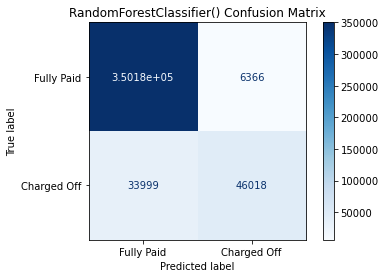

In [244]:
model_results(x_test_scaled,y_test,no_recover,rf)

In [251]:
rf=RandomForestClassifier(n_jobs=4)

In [255]:
rf_params = {'n_estimators':[25,50,100],
    'criterion': ['gini','entropy'],
    'max_depth' :[None,5,1],
    'min_samples_split':[2,3],
    'min_samples_leaf':[1,2],}
scoring =['recall','accuracy']
rf_grid = GridSearchCV(rf,param_grid=rf_params,verbose=3,cv=3,scoring=scoring,refit='recall')


In [ ]:
rf_grid.fit(x_train_final[no_recover],y_train_final)
rf_grid.best_params_, rf_grid.best_score_

In [257]:
rf_grid.best_params_

{'criterion': 'entropy',
 'max_depth': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 25}

In [261]:
rf_grid.best_score_

0.8134682049128908

In [279]:
f = RandomForestClassifier(n_estimators=25,criterion='entropy',n_jobs=4,)

In [280]:
f.fit(x_train_final[no_recover],y_train_final)

<ipython-input-280-0586b49548f0>:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  f.fit(x_train_final[no_recover],y_train_final)


RandomForestClassifier(criterion='entropy', n_estimators=25, n_jobs=4)

In [ ]:
f.

[[569061     37]
 [  1117 567912]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    569098
           1       1.00      1.00      1.00    569029

    accuracy                           1.00   1138127
   macro avg       1.00      1.00      1.00   1138127
weighted avg       1.00      1.00      1.00   1138127



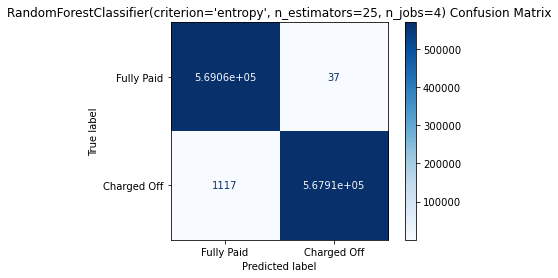

In [281]:
model_results(x_train_final,y_train_final,no_recover,f)

### Final Random Forest result on test here

[[347741   8805]
 [ 33535  46482]]
              precision    recall  f1-score   support

           0       0.91      0.98      0.94    356546
           1       0.84      0.58      0.69     80017

    accuracy                           0.90    436563
   macro avg       0.88      0.78      0.81    436563
weighted avg       0.90      0.90      0.90    436563



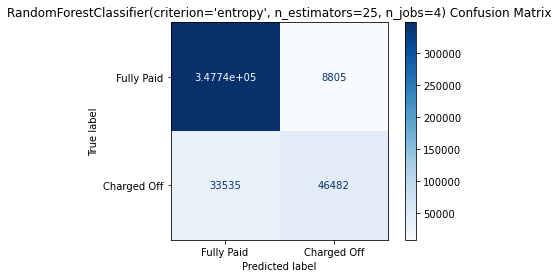

In [286]:
model_results(x_test_scaled,y_test,no_recover,f)

[[347844   8702]
 [ 33569  46448]]
              precision    recall  f1-score   support

           0       0.91      0.98      0.94    356546
           1       0.84      0.58      0.69     80017

    accuracy                           0.90    436563
   macro avg       0.88      0.78      0.81    436563
weighted avg       0.90      0.90      0.90    436563



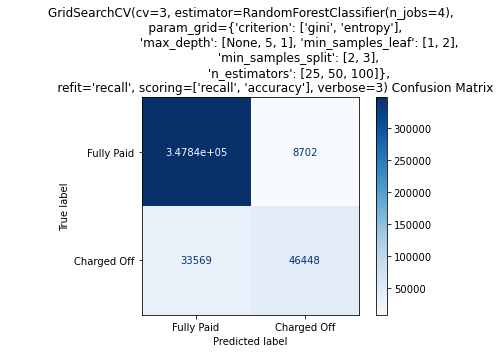

In [259]:
model_results(x_test_scaled,y_test,no_recover,rf_grid)

## Baseline Decision Tree

In [237]:
## running on balanced class weights of original train split
tree = DecisionTreeClassifier(class_weight='balanced')

In [238]:
tree.fit(x_train_scaled[og_no],y_train)

DecisionTreeClassifier(class_weight='balanced')

[[298719  57827]
 [ 57519  22498]]
              precision    recall  f1-score   support

           0       0.84      0.84      0.84    356546
           1       0.28      0.28      0.28     80017

    accuracy                           0.74    436563
   macro avg       0.56      0.56      0.56    436563
weighted avg       0.74      0.74      0.74    436563



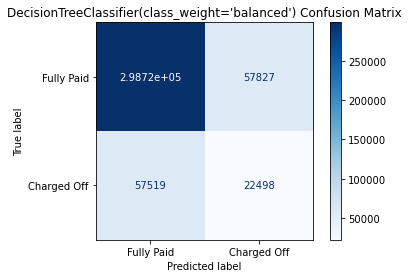

In [239]:
model_results(x_test_scaled,y_test,og_no,tree)

In [283]:
# smote resampled
tree = DecisionTreeClassifier()

In [284]:
tree.fit(x_train_final[no_recover],y_train_final)

DecisionTreeClassifier()

In [285]:
from sklearn import tree as tr

In [287]:
from sklearn.datasets import load_breast_cancer

In [288]:
data = load_breast_cancer()

In [292]:
data.target_names

array(['malignant', 'benign'], dtype='<U9')

In [293]:
df.loan_status.unique()

array(['Fully Paid', 'Charged Off'], dtype=object)

In [296]:
f.estimators_[0]

DecisionTreeClassifier(criterion='entropy', max_features='auto',
                       random_state=473142425)

In [306]:
fn = np.array(no_recover)
cn =  np.array(['Fully Paid', 'Charged Off'])
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (12,12), dpi=800)
tr.plot_tree(tree,
               feature_names = fn,
               class_names=cn,
               filled = True,max_depth=10)

[Text(3523.622523944275, 6946.0, 'int_rate <= 0.243\ngini = 0.5\nsamples = 1138127\nvalue = [569098, 569029]\nclass = Fully Paid'),
 Text(1699.3907814540705, 6342.0, 'total_rec_late_fee <= 0.0\ngini = 0.397\nsamples = 373777\nvalue = [271579, 102198]\nclass = Fully Paid'),
 Text(1043.8207444492816, 5738.0, 'int_rate <= 0.114\ngini = 0.356\nsamples = 348327\nvalue = [267580, 80747]\nclass = Fully Paid'),
 Text(559.336090552895, 5134.0, 'term <= 0.021\ngini = 0.199\nsamples = 138688\nvalue = [123121, 15567]\nclass = Fully Paid'),
 Text(335.2372659991293, 4530.0, 'inq_last_6mths <= 0.0\ngini = 0.182\nsamples = 132024\nvalue = [118684, 13340]\nclass = Fully Paid'),
 Text(200.00870700914237, 3926.0, 'int_rate <= 0.076\ngini = 0.143\nsamples = 94348\nvalue = [87052, 7296]\nclass = Fully Paid'),
 Text(126.32128863735306, 3322.0, 'int_rate <= 0.001\ngini = 0.107\nsamples = 52338\nvalue = [49363, 2975]\nclass = Fully Paid'),
 Text(61.541140618197645, 2718.0, 'annual_inc <= 0.072\ngini = 0.055\n

In [303]:
fn = np.array(no_recover)
cn =  np.array(['Fully Paid', 'Charged Off'])
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (12,12), dpi=800)
tr.plot_tree(f.estimators_[0],
               feature_names = fn,
               class_names=cn,
               filled = True,max_depth=10)


[Text(3739.9196685407946, 6946.0, 'total_bc_limit <= 0.224\nentropy = 1.0\nsamples = 719516\nvalue = [569584, 568543]\nclass = Fully Paid'),
 Text(2053.846266997908, 6342.0, 'total_rec_late_fee <= 0.0\nentropy = 0.997\nsamples = 525227\nvalue = [390963, 439923]\nclass = Charged Off'),
 Text(1080.2069168410042, 5738.0, 'int_rate <= 0.243\nentropy = 0.998\nsamples = 458657\nvalue = [381838, 343709]\nclass = Fully Paid'),
 Text(565.2595449790795, 5134.0, 'sub_grade_A5 <= 0.5\nentropy = 0.803\nsamples = 131843\nvalue = [157776, 51128]\nclass = Fully Paid'),
 Text(374.52928870292885, 4530.0, 'sub_grade_A2 <= 0.5\nentropy = 0.829\nsamples = 119431\nvalue = [139776, 49425]\nclass = Fully Paid'),
 Text(224.7175732217573, 3926.0, 'sub_grade_B2 <= 0.5\nentropy = 0.844\nsamples = 113886\nvalue = [131422, 48985]\nclass = Fully Paid'),
 Text(111.38598326359832, 3322.0, 'pct_tl_nvr_dlq <= 1.0\nentropy = 0.879\nsamples = 97400\nvalue = [108422, 46052]\nclass = Fully Paid'),
 Text(51.55857740585774, 2

In [305]:
f.estimators_[0].get_depth()

58

[[321181  35365]
 [ 28191  51826]]
              precision    recall  f1-score   support

           0       0.92      0.90      0.91    356546
           1       0.59      0.65      0.62     80017

    accuracy                           0.85    436563
   macro avg       0.76      0.77      0.76    436563
weighted avg       0.86      0.85      0.86    436563



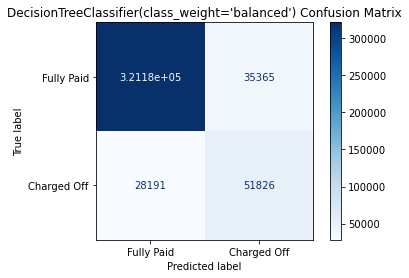

In [241]:
model_results(x_test_scaled,y_test,no_recover,tree)  

Our SMOTE resampled has much better performance here so we will use for the remainder of our models as it was also best performing for Log Reg model

In [126]:
## running grid search on various params
tree_grid1 = {'criterion': ['gini', 'entropy'],
    'max_depth': [1, None, 5,1],
    'min_samples_split': [1,2,5,6,10]
}
tree_gcv = GridSearchCV(estimator = tree,param_grid = tree_grid1, scoring='recall',n_jobs=-2,iid=False, cv=3,verbose=2)

tree_gcv.fit(x_train_final[no_recover],y_train_final)
tree_gcv.best_params_, tree_gcv.best_score_

Fitting 3 folds for each of 40 candidates, totalling 120 fits


[Parallel(n_jobs=-2)]: Using backend LokyBackend with 11 concurrent workers.
[Parallel(n_jobs=-2)]: Done  19 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-2)]: Done 120 out of 120 | elapsed:  9.3min finished
C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


({'criterion': 'gini', 'max_depth': None, 'min_samples_split': 2},
 0.828954236794377)

In [124]:
tree_gcv.best_params_, tree_gcv.best_score_

({'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 2},
 0.8580933514540965)

In [132]:
tree_grid2 = {'min_samples_leaf': [1,3,5,7],
    'min_weight_fraction_leaf' : [0,.2,.4,.6]
}
tree_gcv2 = GridSearchCV(estimator = tree,param_grid = tree_grid2, scoring='recall',n_jobs=-2,iid=False, cv=3,verbose=2)

tree_gcv2.fit(x_train_final[no_recover],y_train_final)
tree_gcv2.best_params_, tree_gcv2.best_score_

Fitting 3 folds for each of 16 candidates, totalling 48 fits


[Parallel(n_jobs=-2)]: Using backend LokyBackend with 11 concurrent workers.
[Parallel(n_jobs=-2)]: Done  19 tasks      | elapsed:   46.1s
[Parallel(n_jobs=-2)]: Done  48 out of  48 | elapsed:  2.3min finished
C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


({'min_samples_leaf': 1, 'min_weight_fraction_leaf': 0}, 0.8292037839981298)

In [121]:
tree_grid1 = {'criterion': ['gini', 'entropy'],
    'max_depth': [1, 2,3,4,5],
    'min_samples_split': [3,4,5,6]
}
tree_gcv = GridSearchCV(estimator = tree_1,param_grid = tree_grid1, scoring='accuracy',n_jobs=-2,iid=False, cv=3,verbose=2)

tree_gcv.fit(x_train_final[no_recover],y_train_final)
tree_gcv.best_params_, tree_gcv.best_score_

Fitting 3 folds for each of 40 candidates, totalling 120 fits


[Parallel(n_jobs=-2)]: Using backend LokyBackend with 11 concurrent workers.
[Parallel(n_jobs=-2)]: Done  19 tasks      | elapsed:   34.3s
[Parallel(n_jobs=-2)]: Done 120 out of 120 | elapsed:  4.9min finished
C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


({'criterion': 'gini', 'max_depth': 5, 'min_samples_split': 6},
 0.7517386082168143)

In [119]:
#when training Gridsearch for recall
tree_gcv.best_params_, tree_gcv.best_score_

({'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 3},
 0.858091592144627)

[[166077 190469]
 [ 15459  64558]]
              precision    recall  f1-score   support

           0       0.91      0.47      0.62    356546
           1       0.25      0.81      0.39     80017

    accuracy                           0.53    436563
   macro avg       0.58      0.64      0.50    436563
weighted avg       0.79      0.53      0.57    436563



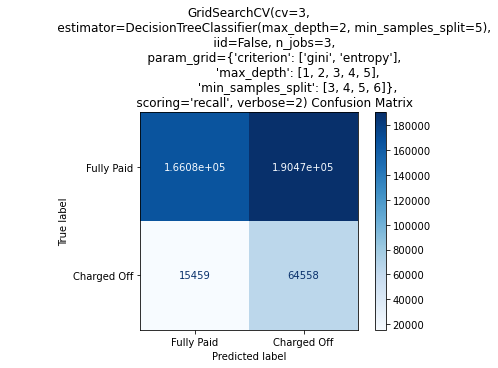

In [120]:
# recall score training results
model_results(x_test_scaled,y_test,no_recover,tree_gcv)

Having run grid search on our decision tree for various parameters the baseline model is the best performing

Notably this is also better performing than our gradient boosted trees as well

## XGBoost Parameter Tuning

In [99]:
test1 = XGBClassifier( learning_rate =0.35, n_estimators=142, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4)

In [100]:
param_test1 = {
 'max_depth': [5,13,4,3],

}
gsearch1 = GridSearchCV(estimator = test1,param_grid = param_test1, scoring='recall',n_jobs=3,iid=False, cv=2,verbose=2)
gsearch1.fit(x_train_final[no_recover],y_train_final)
gsearch1.best_params_, gsearch1.best_score_

Fitting 2 folds for each of 4 candidates, totalling 8 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done   8 out of   8 | elapsed: 13.0min remaining:    0.0s
[Parallel(n_jobs=3)]: Done   8 out of   8 | elapsed: 13.0min finished
C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


({'max_depth': 13, 'min_child_weight': 2}, 0.819132241461128)

[0]	train-auc:0.83657+0.00462	test-auc:0.83640+0.00469
[1]	train-auc:0.87022+0.01292	test-auc:0.86976+0.01272
[2]	train-auc:0.89169+0.00417	test-auc:0.89149+0.00385
[3]	train-auc:0.90216+0.00341	test-auc:0.90199+0.00351
[4]	train-auc:0.91186+0.00284	test-auc:0.91161+0.00309
[5]	train-auc:0.91740+0.00103	test-auc:0.91726+0.00079
[6]	train-auc:0.92187+0.00196	test-auc:0.92175+0.00233
[7]	train-auc:0.92395+0.00144	test-auc:0.92380+0.00172
[8]	train-auc:0.92619+0.00103	test-auc:0.92603+0.00129
[9]	train-auc:0.92809+0.00133	test-auc:0.92783+0.00167
[10]	train-auc:0.92945+0.00140	test-auc:0.92917+0.00167
[11]	train-auc:0.93082+0.00107	test-auc:0.93051+0.00113
[12]	train-auc:0.93192+0.00095	test-auc:0.93161+0.00118
[13]	train-auc:0.93273+0.00090	test-auc:0.93241+0.00108
[14]	train-auc:0.93323+0.00099	test-auc:0.93285+0.00116
[15]	train-auc:0.93391+0.00055	test-auc:0.93351+0.00094
[16]	train-auc:0.93441+0.00041	test-auc:0.93401+0.00085
[17]	train-auc:0.93490+0.00038	test-auc:0.93447+0.00080
[1

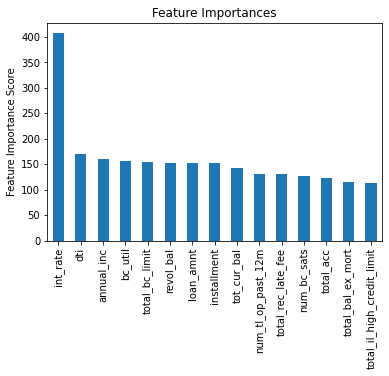

In [101]:
modelfit2(test1, x_train_final, y_train_final,no_recover,x_val,y_val)

[[348106   8440]
 [ 67304  12713]]
              precision    recall  f1-score   support

           0       0.84      0.98      0.90    356546
           1       0.60      0.16      0.25     80017

    accuracy                           0.83    436563
   macro avg       0.72      0.57      0.58    436563
weighted avg       0.79      0.83      0.78    436563



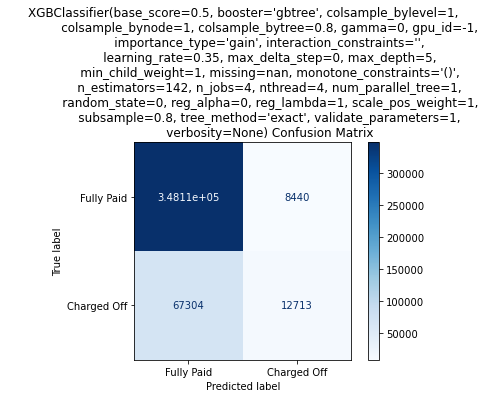

In [102]:
model_results(x_test_scaled,y_test,no_recover,test1)

In [38]:
test2 = XGBClassifier( learning_rate =0.8, n_estimators=58, max_depth=10,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4)

In [39]:
param_test2 = {
 'max_depth': [7,10,13],
 'min_child_weight':[1,1.5,2]
}
gsearch2 = GridSearchCV(estimator = test1,param_grid = param_test2, scoring='recall',n_jobs=3,iid=False, cv=2,verbose=1)
gsearch2.fit(x_train_final[no_recover],y_train_final)
gsearch1.best_params_, gsearch1.best_score_

Fitting 2 folds for each of 9 candidates, totalling 18 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  18 out of  18 | elapsed: 17.6min finished
C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


({'max_depth': 10, 'min_child_weight': 1}, 0.822931695420156)

In [40]:
gsearch2.best_params_, gsearch2.best_score_

({'max_depth': 13, 'min_child_weight': 2}, 0.8287468665273565)

In [42]:
test3 = XGBClassifier( learning_rate =0.8, n_estimators=58, max_depth=13,
 min_child_weight=2, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4)

In [43]:
param_test3 = {
 'max_depth': [13,20,25],
    'min_child_weight':[1.5,2,3]
}
gsearch3 = GridSearchCV(estimator = test3,param_grid = param_test3, scoring='recall',n_jobs=3,iid=False, cv=2,verbose=1)
gsearch3.fit(x_train_final[no_recover],y_train_final)
gsearch3.best_params_, gsearch3.best_score_

Fitting 2 folds for each of 9 candidates, totalling 18 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  18 out of  18 | elapsed: 35.6min finished
C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


({'max_depth': 13, 'min_child_weight': 2}, 0.8287468665273565)

In [ ]:
test3 = XGBClassifier( learning_rate =0.8, n_estimators=58, max_depth=13,
 min_child_weight=2, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4)

In [45]:
param_test3 = {
 'max_depth': [1,4,13]
}
gsearch3 = GridSearchCV(estimator = test3,param_grid = param_test3, scoring='recall',n_jobs=3,iid=False, cv=2,verbose=1)
gsearch3.fit(x_train_final[no_recover],y_train_final)
gsearch3.best_params_, gsearch3.best_score_

Fitting 2 folds for each of 3 candidates, totalling 6 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done   6 out of   6 | elapsed:  3.9min finished
C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


({'max_depth': 13}, 0.8287468665273565)

In [46]:
test4 = XGBClassifier( learning_rate =0.8, n_estimators=58, max_depth=13,
 min_child_weight=2, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4)

In [47]:
param_test4 = {
 'min_child_weight': [1,1.5,2,2.5,4]
}
gsearch4 = GridSearchCV(estimator = test4,param_grid = param_test4, scoring='recall',n_jobs=3,iid=False, cv=2,verbose=1)
gsearch4.fit(x_train_final[no_recover],y_train_final)
gsearch4.best_params_, gsearch4.best_score_

Fitting 2 folds for each of 5 candidates, totalling 10 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  10 out of  10 | elapsed: 14.8min finished
C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


({'min_child_weight': 2}, 0.8287468665273565)

In [72]:
param_test4 = {
 'gamma': [i/ 10.0 for i in range(0,5)]
}
gsearch4 = GridSearchCV(estimator = test4,param_grid = param_test4, scoring='recall',n_jobs=3,iid=False, cv=2,verbose=1)
gsearch4.fit(x_train_final[no_recover],y_train_final)
gsearch4.best_params_, gsearch4.best_score_

Fitting 2 folds for each of 5 candidates, totalling 10 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  10 out of  10 | elapsed:  4.1min finished
C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


({'gamma': 0.4}, 0.8103312843865518)

In [73]:
test4 = XGBClassifier( learning_rate =0.3, n_estimators=21, max_depth=13,
 min_child_weight=2, gamma=0.4, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4)

In [67]:
test4.get_params

<bound method XGBModel.get_params of XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=0.8, gamma=0, gpu_id=None,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.3, max_delta_step=None, max_depth=13,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, nthread=4, num_parallel_tree=None,
              random_state=None, reg_alpha=None, reg_lambda=None,
              scale_pos_weight=None, subsample=0.8, tree_method=None,
              validate_parameters=None, verbosity=None)>

[0]	train-error:0.13821+0.00100	test-error:0.14292+0.00147
[1]	train-error:0.12330+0.00303	test-error:0.12892+0.00245
[2]	train-error:0.11912+0.00182	test-error:0.12513+0.00168
[3]	train-error:0.11517+0.00164	test-error:0.12149+0.00147
[4]	train-error:0.11119+0.00112	test-error:0.11803+0.00057
[5]	train-error:0.10836+0.00082	test-error:0.11532+0.00070
[6]	train-error:0.10653+0.00077	test-error:0.11378+0.00031
[7]	train-error:0.10504+0.00073	test-error:0.11308+0.00025
[8]	train-error:0.10386+0.00056	test-error:0.11227+0.00043
[9]	train-error:0.10291+0.00041	test-error:0.11183+0.00058
[10]	train-error:0.10190+0.00025	test-error:0.11132+0.00054
[11]	train-error:0.10092+0.00025	test-error:0.11089+0.00043
[12]	train-error:0.10000+0.00024	test-error:0.11062+0.00036
[13]	train-error:0.09938+0.00028	test-error:0.11045+0.00045
[14]	train-error:0.09861+0.00019	test-error:0.11035+0.00045
[15]	train-error:0.09776+0.00021	test-error:0.11031+0.00044
[16]	train-error:0.09706+0.00012	test-error:0.1102

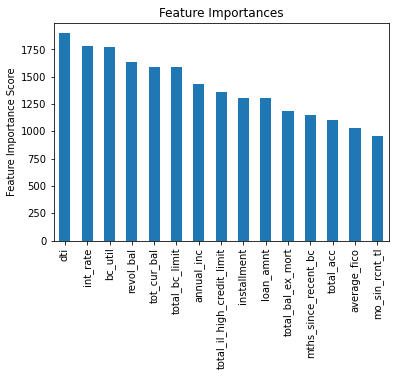

In [74]:
modelfit2(test4, x_train_final, y_train_final,no_recover,x_val,y_val)

[[347928   8618]
 [ 64495  15522]]
              precision    recall  f1-score   support

           0       0.84      0.98      0.90    356546
           1       0.64      0.19      0.30     80017

    accuracy                           0.83    436563
   macro avg       0.74      0.58      0.60    436563
weighted avg       0.81      0.83      0.79    436563



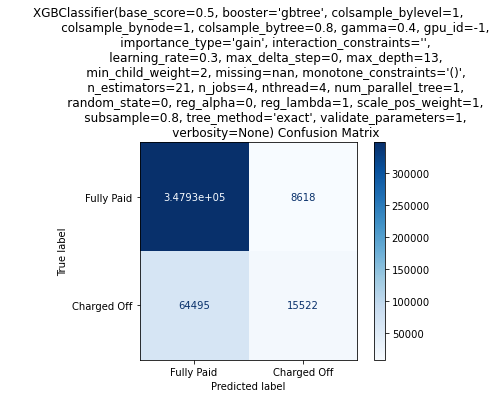

In [75]:
model_results(x_test_scaled,y_test,no_recover,test4)